# Comparing Different Semi-Supervised Techniques for the ASTHMA detection


In many real-world scenarios, labeled data is scarce and expensive to obtain, making it challenging to train effective machine learning models. Semi-supervised learning (SSL) addresses this issue by mixing both labeled and unlabeled data to improve predictive performance. Our project explores and compares different semi-supervised learning techniques on the ASTHMA Detection. By combining small amounts of labeled data with a larger pool of unlabeled data, SSL algorithms can bridge the gap between insufficient labeled data and the need for accurate predictions.

> **Semi-supervised learning** is a machine learning paradigm that incorporates both labeled and unlabeled data for training, offering a cost-effective way to enhance model accuracy when data labeling is limited [[source]](https://en.wikipedia.org/wiki/Semi-supervised_learning).For our projectbook, we implement and analyze the performance of various SSL techniques to demonstrate their efficacy in handling limited labeled data.


<center><p><img src="cmp.jpg" title="Types of learning"/></p></center>  

Img 1 - Types of learning [[source]](https://www.slideshare.net/Dataiku/dataiku-hadoop-summit-semisupervised-learning-with-hadoop-for-understanding-user-web-behaviours)

Since we are dealing with unlabeled data (i.e., unknown instances), semi-supervised learning often borrows key assumptions from unsupervised learning:

- **Continuity assumption**: Points that are close to each other are more likely to share the same label.
- **Cluster assumption**: Data tends to form discrete clusters, and points within the same cluster are more likely to share a label.
- **Manifold assumption**: Data lies approximately on a manifold of much lower dimension than the input space, making it possible to learn effectively with fewer labeled poits.


These assumptions may seem reasonable enough, though counterarguments do exist. But why do we need all these complications? Simply put, because they work — at least in theory.


The core idea behind SSL is somewhat Bayesian in nature, but we won't dive into that in detail.

An analogy to SSL can be found in human inductive logic: we may only know a few instances of a phenomenon, but we try to infer general principles. Similarly, in SSL, algorithms use a small number of labeled data points (our reference points) to find the general pattern that can be applied to the unlabeled data. However, this is not always straightforward. Some algorithms aim to generalize the given data (by inferring a function that best describes the data), while others use **transductive learning** — which focuses on predicting specific instances based on the training data without the need for generalization. [Learn more about transductive learning](https://en.wikipedia.org/wiki/Transduction_(machine_learning)).

In summary, inductive learning seeks to generalize from the training data and then predict new data, whereas transductive learning directly tries to predict new data from the training data, bypassing generalization.

Let's start coding. 


In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import shuffle

`sklearn` offers two main semi-supervised learning algorithms: Label Propagation and Label Spreading. Let's go ahead and import them so we can start experimenting.

Additionally, we’ll use the [pomegranate library](https://pomegranate.readthedocs.io/en/latest/index.html). It’s a Bayesian library with many features, but for now, we’ll focus on just one or two models from it. The nice thing about pomegranate is that it follows the same syntax as `sklear.. 

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.semi_supervised import LabelPropagation, LabelSpreading
from sklearn.metrics import roc_auc_score

In [3]:
import warnings
warnings.simplefilter('ignore') 
np.random.seed(1) 

### Dataset Description: Asthma Disease Dataset

The dataset analyzed here is the **Asthma Disease Dataset**, a synthetic dataset created for educational purposes and shared under the CC BY 4.0 license by Rabie El Kharoua. This dataset is designed for data science and machine learning applications, offering rich health information about asthma patients.

#### Attributes:
- **Patient ID**: Unique identifier ranging from 5034 to 7425.
- **Demographic Details**:
  - **Age**: Patient's age (5 to 80 years).
  - **Gender**: 0 for Male, 1 for Female.
  - **Ethnicity**: 
    - 0: Caucasian
    - 1: African American
    - 2: Asian
    - 3: Other
  - **EducationLevel**: 
    - 0: None
    - 1: High School
    - 2: Bachelor's
    - 3: Higher

- **Lifestyle Factors**:
  - **BMI**: Body Mass Index (15 to 40).
  - **Smoking**: 0 for No, 1 for Yes.
  - **PhysicalActivity**: Weekly hours of physical activity (0 to 10 hours).
  - **DietQuality**: Diet quality score (0 to 10).
  - **SleepQuality**: Sleep quality score (4 to 10).

- **Environmental and Allergy Factors**:
  - **PollutionExposure**: Exposure to pollution (0 to 10).
  - **PollenExposure**: Exposure to pollen (0 to 10).
  - **DustExposure**: Exposure to dust (0 to 10).
  - **PetAllergy**: 0 for No, 1 for Yes.

- **Medical History**:
  - **FamilyHistoryAsthma**: 0 for No, 1 for Yes.
  - **HistoryOfAllergies**: 0 for No, 1 for Yes.
  - **Eczema**: 0 for No, 1 for Yes.
  - **HayFever**: 0 for No, 1 for Yes.
  - **GastroesophagealReflux**: 0 for No, 1 for Yes.

- **Clinical Measurements**:
  - **LungFunctionFEV1**: Forced Expiratory Volume in 1 second (1.0 to 4.0 liters).
  - **LungFunctionFVC**: Forced Vital Capacity (1.5 to 6.0 liters).

- **Symptoms**:
  - **Wheezing**: 0 for No, 1 for Yes.
  - **ShortnessOfBreath**: 0 for No, 1 for Yes.
  - **ChestTightness**: 0 for No, 1 for Yes.
  - **Coughing**: 0 for No, 1 for Yes.
  - **NighttimeSymptoms**: 0 for No, 1 for Yes.
  - **ExerciseInduced**: 0 for No, 1 for Yes.

- **Diagnosis Information**:
  - **Diagnosis**: 0 for No, 1 for Yes.

- **Confidential Information**:
  - **DoctorInCharge**: Contains confidential information, with "Dr_Confid" as the value for all patients.

#### Additional Information:
- **Missing Values**: None.
- **Size**: 2,392 patients.
- **Class Distribution**: Not specified in the provided description.


In [4]:
data = pd.read_csv('data.csv')
df = pd.DataFrame(data, columns=data.columns)
df['target'] = data['Diagnosis']

In [5]:
df.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,...,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis,DoctorInCharge,target
0,5034,63,0,1,0,15.848744,0,0.894448,5.488696,8.701003,...,4.941206,0,0,1,0,0,1,0,Dr_Confid,0
1,5035,26,1,2,2,22.757042,0,5.897329,6.341014,5.153966,...,1.702393,1,0,0,1,1,1,0,Dr_Confid,0
2,5036,57,0,2,1,18.395396,0,6.739367,9.196237,6.840647,...,5.022553,1,1,1,0,1,1,0,Dr_Confid,0
3,5037,40,1,2,1,38.515278,0,1.404503,5.826532,4.253036,...,2.300159,1,0,1,1,1,0,0,Dr_Confid,0
4,5038,61,0,0,3,19.283802,0,4.604493,3.127048,9.625799,...,3.067944,1,1,1,0,0,1,0,Dr_Confid,0


Now we will just briefly look through our dataset

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2392 entries, 0 to 2391
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   PatientID               2392 non-null   int64  
 1   Age                     2392 non-null   int64  
 2   Gender                  2392 non-null   int64  
 3   Ethnicity               2392 non-null   int64  
 4   EducationLevel          2392 non-null   int64  
 5   BMI                     2392 non-null   float64
 6   Smoking                 2392 non-null   int64  
 7   PhysicalActivity        2392 non-null   float64
 8   DietQuality             2392 non-null   float64
 9   SleepQuality            2392 non-null   float64
 10  PollutionExposure       2392 non-null   float64
 11  PollenExposure          2392 non-null   float64
 12  DustExposure            2392 non-null   float64
 13  PetAllergy              2392 non-null   int64  
 14  FamilyHistoryAsthma     2392 non-null   

In [7]:
df.describe()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,PhysicalActivity,DietQuality,SleepQuality,...,LungFunctionFEV1,LungFunctionFVC,Wheezing,ShortnessOfBreath,ChestTightness,Coughing,NighttimeSymptoms,ExerciseInduced,Diagnosis,target
count,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,...,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000
mean,6229.500000,42.137960,0.493311,0.669732,1.307274,27.244877,0.141722,5.051786,5.022867,7.019012,...,2.548564,3.741270,0.596154,0.500418,0.503344,0.503344,0.602425,0.604933,0.051839,0.051839
std,690.655244,21.606655,0.500060,0.986120,0.898242,7.201628,0.348838,2.903574,2.909980,1.732475,...,0.861809,1.303689,0.490770,0.500104,0.500093,0.500093,0.489499,0.488967,0.221749,0.221749
min,5034.000000,5.000000,0.000000,0.000000,0.000000,15.031803,0.000000,0.001740,0.003031,4.001437,...,1.000459,1.500045,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5631.750000,23.000000,0.000000,0.000000,1.000000,20.968313,0.000000,2.578333,2.432043,5.498500,...,1.824113,2.607489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,6229.500000,42.000000,0.000000,0.000000,1.000000,27.052202,0.000000,5.016881,5.115383,6.975839,...,2.553244,3.734982,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
75%,6827.250000,61.000000,1.000000,1.000000,2.000000,33.555903,0.000000,7.540234,7.544216,8.526950,...,3.292897,4.864121,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
max,7425.000000,79.000000,1.000000,3.000000,3.000000,39.985611,1.000000,9.995809,9.999904,9.996235,...,3.999719,5.999421,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Preprocessing Steps




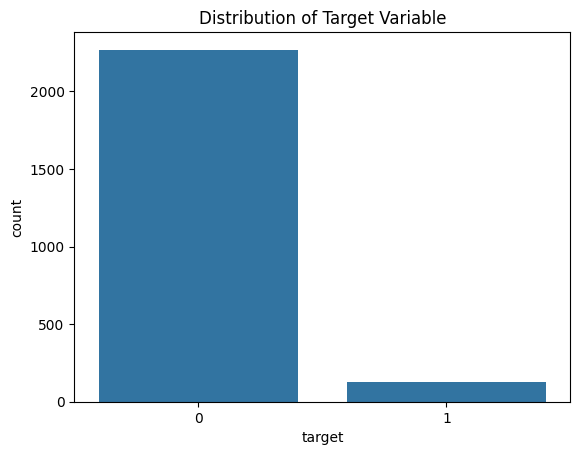

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the target variable distribution
sns.countplot(data=df, x='target')
plt.title('Distribution of Target Variable')
plt.show()


#### Data Shuffling
To ensure the dataset is not influenced by its inherent order, we will shuffle the data. This step prevents any unintended bias due to the order of the records.

#### Dimensionality Reduction
Dimensionality will be reduced by dropping certain features to simplify the dataset.  

*Disclaimer*: While training Logistic Regression (LR) on all features would yield better results compared to models like Linear Programming (LP) or Linear Search (LS), the goal here is to demonstrate the models rather than achieve the best performance. Additionally, the performance of metric-based models tends to degrade with an increasing number of dimensions, depending on the metric used.

In [9]:
df = shuffle(df, random_state=1)
X = df.drop(['DoctorInCharge','Diagnosis','PatientID','target'], axis=1)
y = df['target']

In [10]:
df.drop(['DoctorInCharge','Diagnosis','PatientID','target'], axis=1,inplace = True)

### Heatmap of Feature Correlations

The following code generates a heatmap to visualize the correlations between features in the dataset:  


<Axes: >

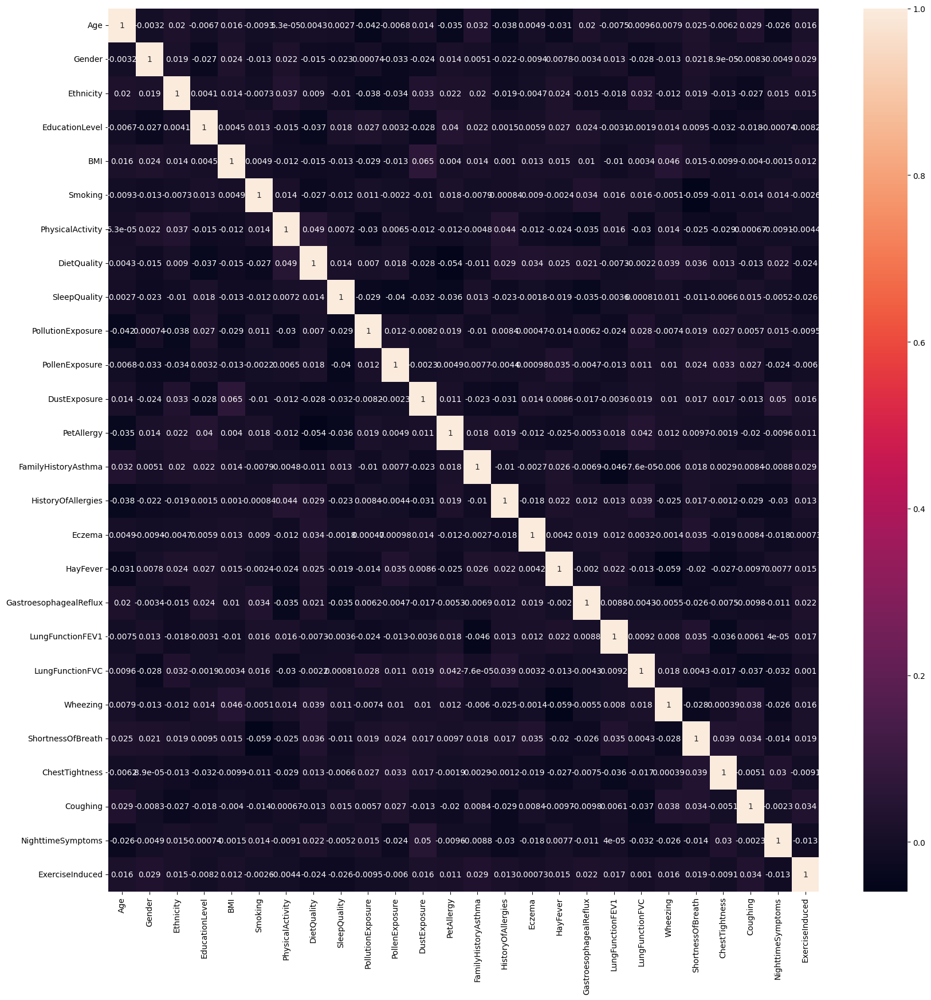

In [11]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True)

### Pairplot Analysis

Since the dataset now contains only seven features, we can utilize a **[pairplot](https://seaborn.pydata.org/generated/seaborn.pairplot.html)**. A pairplot creates scatterplots for each pair of features and displays their distributions along the diagonal. This visualization helps identify correlations and provides insight into how features can be normalized.

#### Key Considerations:
- **Time Complexity**: Generating a pairplot can be time-intensive, as the computational cost increases with the number of features and data points.  
- **Dataset Size**: While it is possible to apply the pairplot to the entire dataset (`df`), this will take significantly more time and result in smaller individual graphs due to the higher number of features and data points.

#### Expected Outcome:
By plotting the pairplot on the reduced feature set, you can observe the relationships among the remaining features and verify the removal of highly correlated features mentioned earlier.


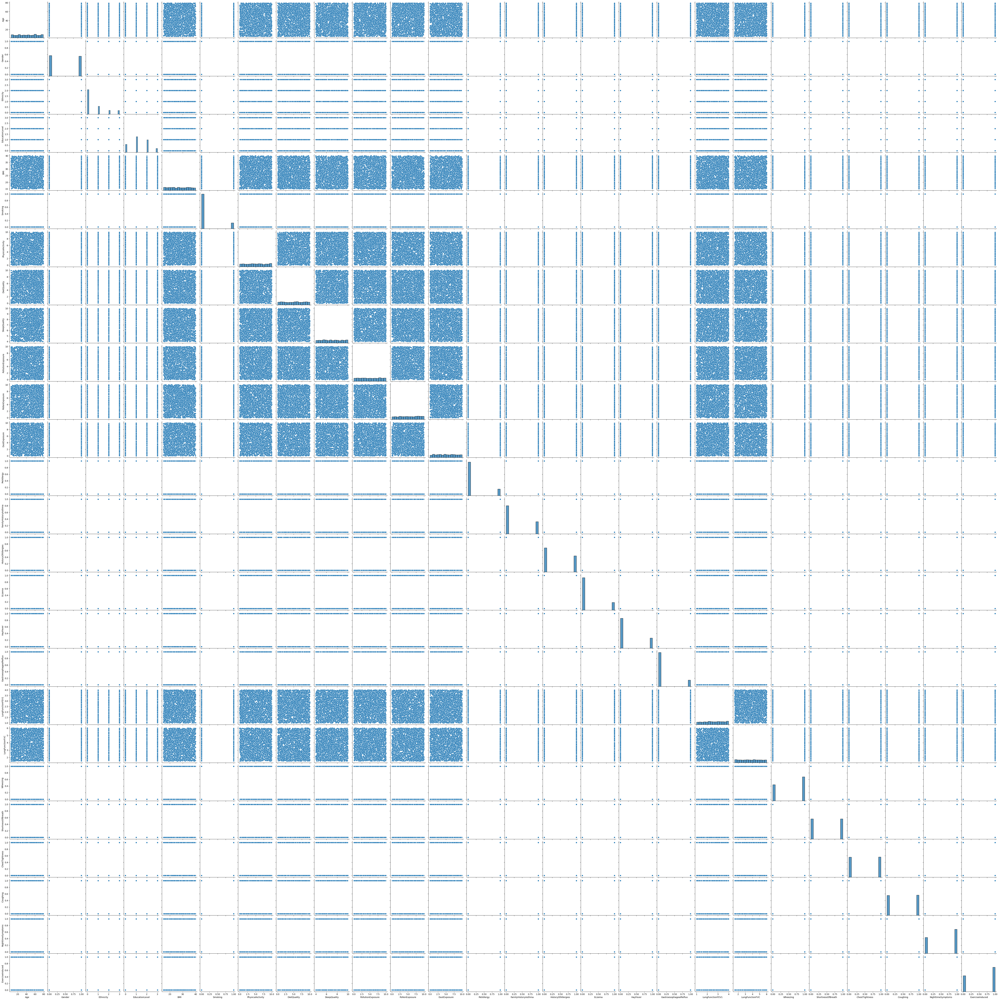

In [12]:
sns.pairplot(X)


#### Data Preparation
We will prepare the data as follows:  
1. Create the feature matrix (`X`) and the target vector (`Y`).  
2. Split the data into three parts: 
   - Labeled training data
   - Unlabeled training data
   - Test data
   - 
The common practice (most libs will need it that way) is to label unlabeled data `-1`. Some libs will only accept `NaN` as label for unlabeled data.

In [13]:
X_1, X_2, X_3  = np.split(X, [int(.1*len(X)), int(.5*len(X))])
y_1, y_2, y_3  = np.split(y, [int(.1*len(y)), int(.5*len(y))])
y_1_2 = np.concatenate((y_1, y_2.apply(lambda x: -1)))
X_1_2 = np.concatenate((X_1, X_2))

In [14]:
index = ['Algorithm', 'ROC AUC']
results = pd.DataFrame(columns=index)

In [15]:
logreg = LogisticRegression(random_state=1, class_weight='balanced')
logreg.fit(X_1, y_1)
results = results._append(pd.Series(['Logistic Regression', roc_auc_score(y_3, logreg.predict_proba(X_3)[:,1])], 
                                   index=index), ignore_index=True)

In [16]:
(logreg.predict([list(X.loc[i]) for i in range(len(X))]) == y).sum()/len(y)

0.697324414715719

Just for reference LR timings.

*Reminder: df is 569x31 dense matrix*

In [17]:
%%timeit
logreg_test = LogisticRegression(random_state=1, class_weight='balanced')
logreg_test.fit(df, y)
logreg_test.predict_proba(df)

46.3 ms ± 796 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Label Propagation

#### Overview
Label Propagation (LP) is a semi-supervised learning algorithm that propagates labels from labeled data points to unlabeled ones based on their proximity. At first glance, it resembles a clustering algorithm, but it involves deeper mathematical operations.

#### Notation
- **Y**: The label matrix with size \((l + u) \times C\), where:
  - \(l\): Number of labeled data points.
  - \(u\): Number of unlabeled data points.
  - \(C\): Number of classes.  
  For binary classification tasks, \(C = 2\), resulting in two columns. The label matrix is similar to what is returned by the `predict_proba` method.

#### Algorithm Mechanics

1. **Graph Construction**  
   The algorithm creates a fully connected graph where:  
   - Nodes represent all data points (labeled and unlabeled).  
   - Edges between nodes are weighted as follows:  

   \[
   w_{i,j} = \exp\left(-\frac{d_{i,j}^2}{\sigma^2}\right)
   \]

   - \(d_{i,j}\): Distance function (Euclidean in this case, but it can be customized).  
   - \(\sigma\): A hyperparameter controlling weight shrinkage.

2. **Transition Matrix \(T\)**  
   The probabilistic transition matrix \(T\) is calculated as:  

   \[
   T_{i,j} = \frac{w_{i,j}}{\sum_{k=1}^{l+u} w_{i,k}}
   \]

   - \(T\) represents the probability of a data point belonging to a class.  
   - Labeled data points have a probability of 1.0 for their known class.  
   - Unlabeled data points derive their class probabilities from their neighbors.

#### Algorithm Steps
1. **Propagate**: Update the label matrix \(Y\) using \(Y \leftarrow TY\) (propagating labels from labeled to unlabeled data).  
2. **Normalize Rows**: Normalize each row of \(Y\) by dividing its elements by the row sum.  
3. **Clamp Labeled Data**: Fix the labeled data to prevent changes to their labels during propagation.  
4. **Repeat**: Iterate steps 1-3 until \(Y\) converges (i.e., label assignments stabilize).

#### Weighting Functions in Scikit-learn
- **RBF Kernel**: Uses the weight formula above. Produces a dense transition matrix and allows more tuning options but requires more computational resources.  
  - Scikit-learn modifies the formula, replacing \(\sigma^2\) with `gamma` as a parameter.
- **KNN Kernel**: Uses a sparse representation:  
  \[
  1(x' \in kNN(x))
  \]
  - Faster to compute and more memory efficient.


In [18]:
def label_prop_test(kernel, params_list, X_train, X_test, y_train, y_test):
    plt.figure(figsize=(20,10))
    n, g = 1, 0
    roc_scores = []
    if kernel == 'rbf':
        for g in params_list:
            lp = LabelPropagation(kernel=kernel, n_neighbors=n, gamma=g, max_iter=100000, tol=0.0001)
            lp.fit(X_train, y_train)
            roc_scores.append(roc_auc_score(y_test, lp.predict_proba(X_test)[:,1]))
    if kernel == 'knn':
        for n in params_list:
            lp = LabelPropagation(kernel=kernel, n_neighbors=n, gamma=g, max_iter=100000, tol=0.0001)
            lp.fit(X_train, y_train)
            roc_scores.append(roc_auc_score(y_test, lp.predict_proba(X_test)[:,1]))
    plt.figure(figsize=(16,8));
    plt.plot(params_list, roc_scores)
    plt.title('Label Propagation ROC AUC with ' + kernel + ' kernel')
    plt.show()
    print('Best metrics value is at {}'.format(params_list[np.argmax(roc_scores)]))

<Figure size 2000x1000 with 0 Axes>

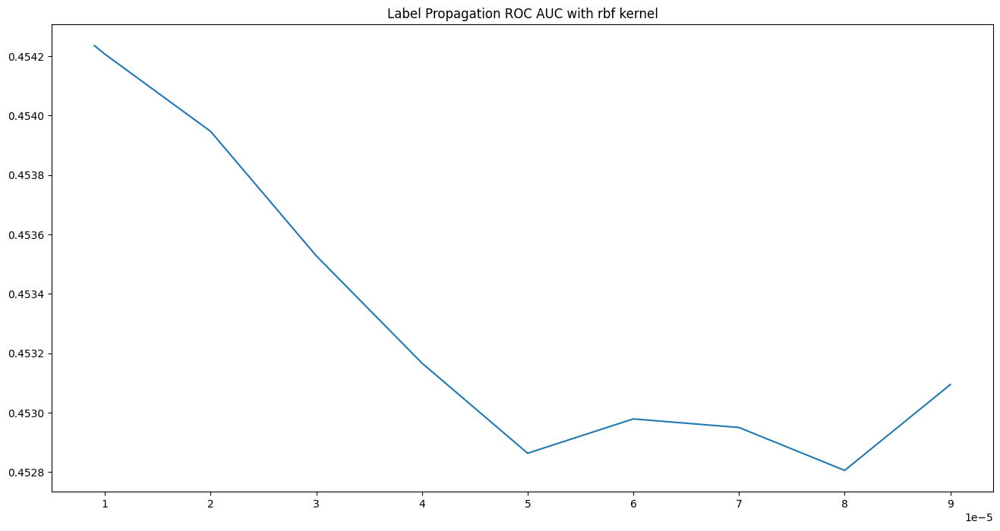

Best metrics value is at 9e-06


In [19]:
gammas = [9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5]
label_prop_test('rbf', gammas, X_1_2, X_3, y_1_2, y_3)

<Figure size 2000x1000 with 0 Axes>

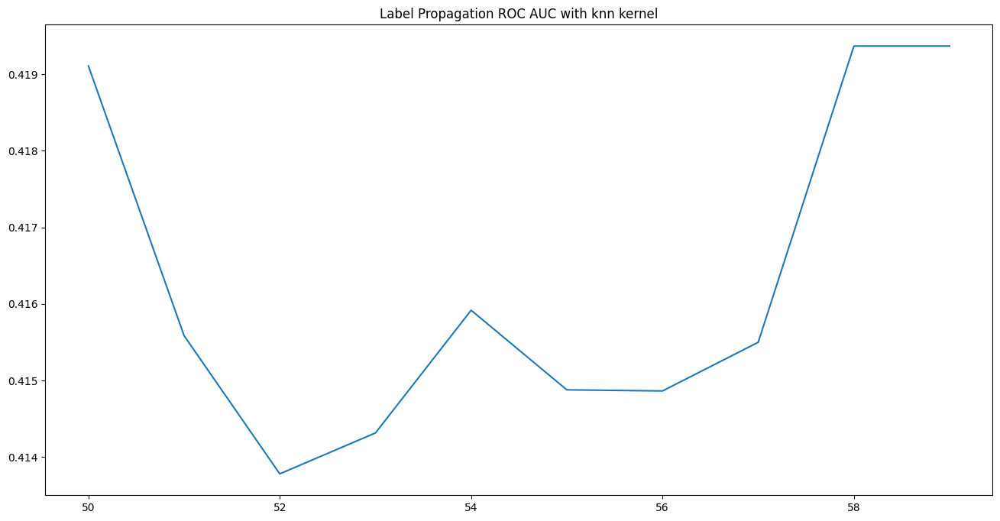

Best metrics value is at 59


In [20]:
ns = np.arange(50,60)
label_prop_test('knn', ns, X_1_2, X_3, y_1_2, y_3)

Now you can define your model separately with the best (or whatever) hyperparameter value and check its score

In [21]:
lp_rbf = LabelPropagation(kernel='rbf', gamma=9e-6, max_iter=100000, tol=0.0001)
lp_rbf.fit(X_1_2, y_1_2)
results = results._append(pd.Series(['Label Propagation RBF', 
                                    roc_auc_score(y_3, lp_rbf.predict_proba(X_3)[:,1])], index=index), ignore_index=True)

lp_knn = LabelPropagation(kernel='knn', n_neighbors=59, max_iter=100000, tol=0.0001)
lp_knn.fit(X_1_2, y_1_2)
results = results._append(pd.Series(['Label Propagation KNN', 
                                    roc_auc_score(y_3, lp_knn.predict_proba(X_3)[:,1])], index=index), ignore_index=True)

In [22]:
(lp_knn.predict([list(X.loc[i]) for i in range(len(X))]) == y).sum()/len(y)

0.9481605351170569

### Computational Considerations

#### Performance and Time Complexity
The performance of Label Propagation varies significantly depending on the representation of the data:  
- **Dense Matrices**: The algorithm performs reasonably well but can be computationally expensive.  
- **Sparse Representation**: Performance degrades drastically, making it almost unusable in some cases. The **KNN kernel**, however, is comparatively more manageable but still not ideal for large datasets.

#### Solutions
To address these computational challenges, consider the following approaches:  
1. **Sparse Label Propagation**: Refer to [Sparse Label Propagation](https://arxiv.org/abs/1612.01414) for techniques optimized for sparse data.  
2. **Dimensionality Reduction**: Applying methods such as PCA, ICA, or RCA can reduce the data's complexity and improve computational efficiency.

#### Recommendation
For practical implementations, running the algorithm on your machine will provide a clearer understanding of the time complexity. Evaluate the results to determine whether dense or sparse representations suit your needs.


In [23]:
rbf_lp_test = LabelPropagation(kernel='rbf')
rbf_lp_test.fit(df, y)
rbf_lp_test.predict_proba(df);

In [24]:
(rbf_lp_test.predict([list(X.loc[i]) for i in range(len(X))]) == y).sum()/len(y)

0.903010033444816

In [25]:
%%timeit
knn_lp_test = LabelPropagation(kernel='knn')
knn_lp_test.fit(df, y)
knn_lp_test.predict_proba(df);

45.4 ms ± 2.03 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Label Spreading

Next one is `LabelSpreading` (LS). The algorithm is very similar to spectral clustering algorithm *normalized cuts algorithm* ([look here](https://en.wikipedia.org/wiki/Spectral_clustering), [here](https://towardsdatascience.com/spectral-clustering-for-beginners-d08b7d25b4d8) and [here](https://papers.nips.cc/paper/2092-on-spectral-clustering-analysis-and-an-algorithm.pdf)).
LS will create a affinity matrix (same as LP weights calculation step): 

$$W_{i,j} = exp(\frac{-||x_i - x_j||^2}{\sigma^2})$$

for every $i\neq j$ and $W_{i,j} = 0$ for every $i = j$

Then we will construct the matrix (Laplacian):

$$S = D^{-1/2}WD^{−1/2}$$

where D - diagonal matrix with its *(i,i)*-element equal to the sum of the i-th row of W.

These two steps is just a spectral clustering on all our data. Next two is more interesting:
 
Iterate $F(t+1) = αSF(t)+(1−α)Y$ until convergence, where α is a parameter in (0, 1), F(t) - classifying function

Let $F^*$ denote the limit of the sequence {F(t)}. Label each point $x_i$ as a label $y_i = argmax≤F^*_{i,j}$

During each iteration of the third step each point receives the information from its neighbors (first term), and also retains its initial information (second term). The parameter α specifies the relative amount of the information from its neighbors and its initial label information. Finally, the label of each unlabeled point is set to be the class of which it has received most information during the iteration process.

You can read article about Label Spreading [here](http://citeseer.ist.psu.edu/viewdoc/download;jsessionid=19D11D059FCEDAFA443FB135B4065A6A?doi=10.1.1.115.3219&rep=rep1&type=pdf), `sklearn` user docs are [here](https://scikit-learn.org/stable/modules/generated/sklearn.semi_supervised.LabelSpreading.html).

In [26]:
def labels_spread_test(kernel, hyperparam, alphas, X_train, X_test, y_train, y_test):
    plt.figure(figsize=(20,10))
    n, g = 1, 0
    roc_scores = []
    if kernel == 'rbf':
        g = hyperparam
    if kernel == 'knn':
        n = hyperparam
    for alpha in alphas:
        ls = LabelSpreading(kernel=kernel, n_neighbors=n, gamma=g, alpha=alpha, max_iter=1000, tol=0.001)
        ls.fit(X_train, y_train)
        roc_scores.append(roc_auc_score(y_test, ls.predict_proba(X_test)[:,1]))
    plt.figure(figsize=(16,8));
    plt.plot(alphas, roc_scores);
    plt.title('Label Spreading ROC AUC with ' + kernel + ' kernel')
    plt.show();
    print('Best metrics value is at {}'.format(alphas[np.argmax(roc_scores)]))

<Figure size 2000x1000 with 0 Axes>

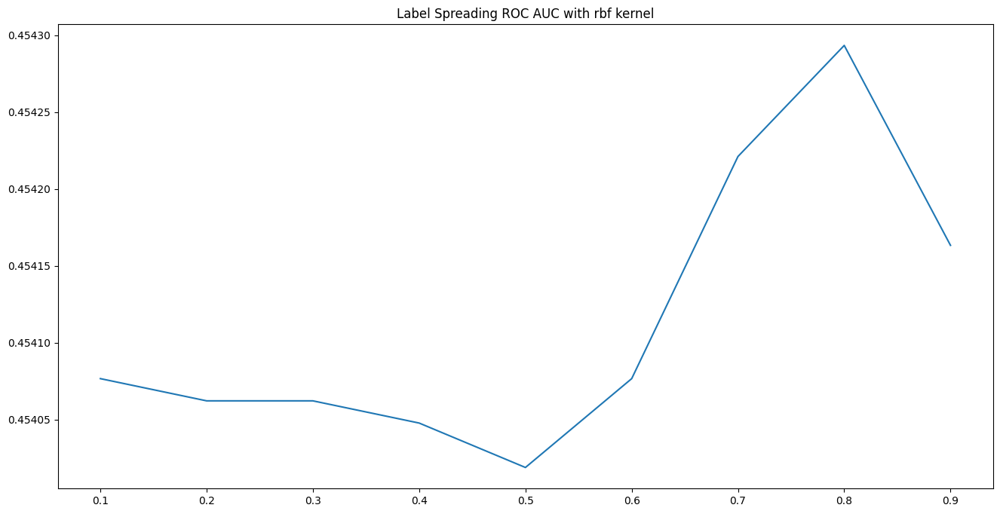

Best metrics value is at 0.8


In [27]:
alphas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]  
labels_spread_test('rbf', 1e-5, alphas, X_1_2, X_3, y_1_2, y_3)

<Figure size 2000x1000 with 0 Axes>

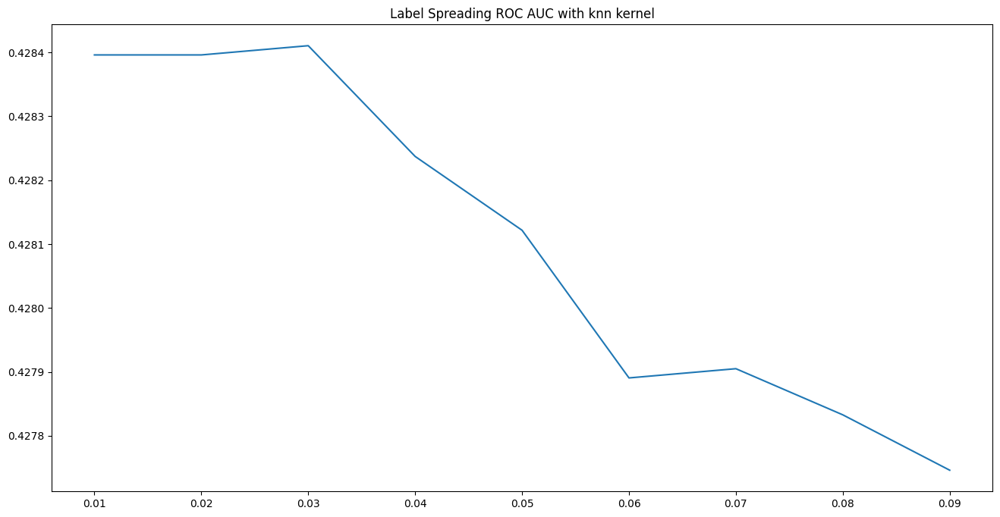

Best metrics value is at 0.03


In [28]:
alphas = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09]  
labels_spread_test('knn', 53, alphas, X_1_2, X_3, y_1_2, y_3)

In [29]:
ls_rbf = LabelSpreading(kernel='rbf', gamma=9e-6, alpha=0.8, max_iter=1000, tol=0.001)
ls_rbf.fit(X_1_2, y_1_2)
results = results._append(pd.Series(['Label Spreading RBF', 
                                    roc_auc_score(y_3, ls_rbf.predict_proba(X_3)[:,1])], index=index), ignore_index=True)
ls_knn = LabelSpreading(kernel='knn', n_neighbors=53, alpha=0.03, max_iter=1000, tol=0.001)
ls_knn.fit(X_1_2, y_1_2)
results = results._append(pd.Series(['Label Spreading KNN', 
                                    roc_auc_score(y_3, ls_knn.predict_proba(X_3)[:,1])], index=index), ignore_index=True)

In [30]:
(ls_rbf.predict([list(X.loc[i]) for i in range(len(X))]) == y).sum()/len(y)

0.9481605351170569

In [31]:
(ls_knn.predict([list(X.loc[i]) for i in range(len(X))]) == y).sum()/len(y)

0.9481605351170569

And timings.

In [32]:
%%timeit
knn_ls_test = LabelSpreading(kernel='rbf')
knn_ls_test.fit(df, y)
knn_ls_test.predict_proba(df);

805 ms ± 12.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [33]:
%%timeit
knn_ls_test = LabelSpreading(kernel='knn')
knn_ls_test.fit(df, y)
knn_ls_test.predict_proba(df);

46.4 ms ± 2.52 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [34]:
results

,Algorithm,ROC AUC
0,Logistic Regression,0.448227
1,Label Propagation RBF,0.454236
2,Label Propagation KNN,0.419369
3,Label Spreading RBF,0.454236
4,Label Spreading KNN,0.428410
